In [2]:
import numpy as np 
import matplotlib.pyplot as plt
import random 


import itertools


In [3]:
#Define constants
p_sat = 2.7*10**14 # Saturation density (g/cm^-3)
c = 2.998e8 # Speed of light (m/s)
def convert_gcm3_to_mev_fm3(density_gcm3):
    # Convert g/cm^3 to MeV/fm^3
    density_mev_fm3 = density_gcm3 / (1.7827e12)  
    return density_mev_fm3

p_sat_Mev_fm3 = convert_gcm3_to_mev_fm3(p_sat) # Saturation density in MeV/fm^3


In [4]:
p_sat_Mev_fm3

151.45565714926798

In [5]:
def calculate_P(rho, K, gamma):
    # Calculate the pressure using the equation of state
    return K * (rho**gamma)  # Pressure in MeV/fm^3

def calculate_K(P, rho, gamma):
    # Calculate the K parameter using the equation of state
    return P / (rho**gamma)  # K in MeV/fm^3

def EOS_polytrope(rho, rho_i, gamma_i, K_i,P_i,E_i):
    if gamma_i == 1:
        # Special case for gamma = 1 (non-relativistic)
        return (E_i/rho_i) * rho + K_i * np.log(1/rho_i) * rho - K_i * np.log(1/rho) * rho
    return (E_i/rho_i - P_i/(rho_i * (gamma_i  - 1))) * rho + K_i * rho**gamma_i / (gamma_i - 1)


def NLD(P):
    return 119.05736 + 304.80445 * (1 - np.exp(- P/48.61465)) + 33722.34448 * (1 - np.exp(- P/17499.47411))
    
def PS(P):
    return 9805.95*(1 - np.exp(-0.000193624 * P)) + 212.072 * (1 - np.exp(-0.401508 * P))+ 1.69483
 

In [8]:
P_NLD = NLD(p_sat_Mev_fm3)
P_PS = PS(p_sat_Mev_fm3)
print(f"P_NLD: {P_NLD}, P_PS: {P_PS}")

P_NLD: 700.9439878392125, P_PS: 497.15517383620085


In [9]:
def HLPS_2(P):
    return 172.858 * (1 - np.exp(- P/22.8644)) + 2777.75 * (1 - np.exp(- P/1909.97)) + 161.553
def HLPS_3(P):
    return 131.811 * (1 - np.exp(-P/4.41577)) + 924.143 * (1 - np.exp(- P/523.736)) + 81.5682
print(f"HLPS_2: {HLPS_2(1.722) }, HLPS_3: {HLPS_3(151.668) / p_sat_Mev_fm3}")


HLPS_2: 176.59664666832964, HLPS_3: 2.943007614211516


In [10]:

from scipy.interpolate import CubicSpline
ρ_scatter = np.array([87.07,107.1,118.1,129.9,142.5,155.9,165.3])
P_scatter_HLPS2 = [0.4470,0.7162,0.9094,1.154,1.464,1.851,2.163]
P_scatter_HLPS3 = [0.6960,1.150,1.473,1.880,2.392,3.028,3.542]

In [11]:
spl_HLPS_2 = CubicSpline(ρ_scatter,P_scatter_HLPS2)
spl_HLPS_3 = CubicSpline(ρ_scatter,P_scatter_HLPS3)
ρ_sat_MeV = p_sat_Mev_fm3 # Saturation density in MeV/fm^3
# Defining a range of mass density values
ρ_range = np.linspace(ρ_scatter[0],ρ_scatter[-1],200)
P_saturation_HLPS_2 = spl_HLPS_2(ρ_sat_MeV)
P_saturation_HLPS_3 = spl_HLPS_3(ρ_sat_MeV)


plt.show()

946.5978571829248
946.5978571829248
946.5978571829248
946.5978571829248
946.5978571829248
946.5978571829248
946.5978571829248
946.5978571829248
1444393.7029768748
1444393.7029768748
1444393.7029768748
1444393.7029768748
1444393.7029768748
1444393.7029768748
1444393.7029768748
1444393.7029768748


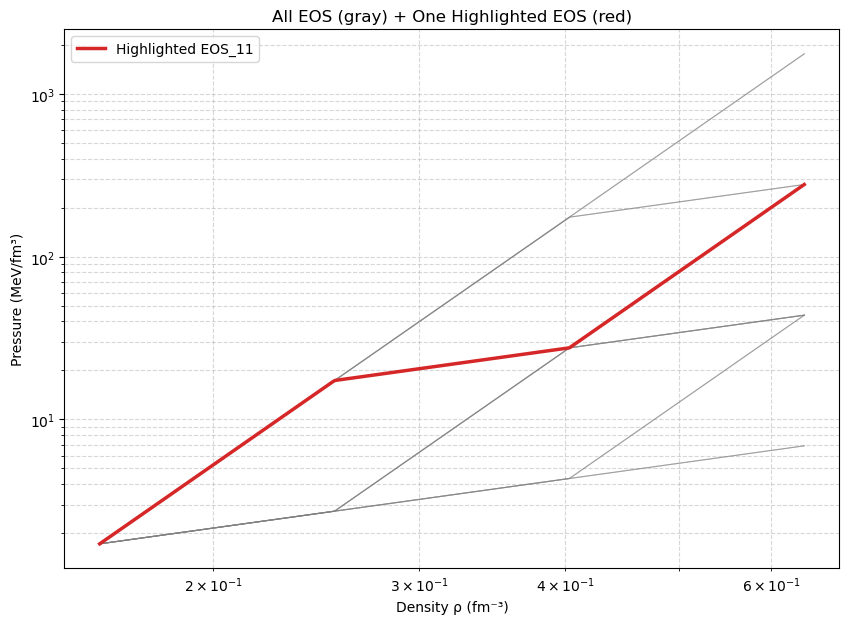

Highlighted EOS index: 11


In [158]:
import matplotlib.pyplot as plt
import random
P0 = 1.722
# Generate EOS models (same as before)
p_sat = p_sat_Mev_fm3  # MeV/fm³
initial_rho = 0.16  # fm⁻³
segments = 4
gamma_options = [1, 5]
base_epsilon = HLPS_2(P0)
# print(base_epsilon)# Base energy density for the first segment
generator = EOSGenerator(p_saturation=p_sat, initial_density=initial_rho, segments=segments, gamma_options=gamma_options)
generator.generate(base_epsilon=base_epsilon, P0=P0)
eos_models = generator.get_models()

# Randomly pick one EOS model to highlight
highlight_index = random.randint(0, len(eos_models) - 1)
highlight_eos = eos_models[highlight_index]

# Create density points for plotting
rho_plot = np.linspace(initial_rho, initial_rho * segments, 500)

# Plot all EOS in gray
fig, ax = plt.subplots(figsize=(10,7))
for eos in eos_models:
    E, P = eos.get_curve(rho_plot)
    ax.plot(rho_plot, P, color='gray', lw=0.8, alpha=0.5)

# Plot the highlighted EOS
E_highlight, P_highlight = highlight_eos.get_curve(rho_plot)
ax.plot(rho_plot, P_highlight, color='tab:red', lw=2.5, label=f"Highlighted {highlight_eos.name}")

# Set plot properties
ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Density ρ (fm⁻³)")
ax.set_ylabel("Pressure (MeV/fm³)")
ax.set_title("All EOS (gray) + One Highlighted EOS (red)")
ax.grid(True, which='both', linestyle='--', alpha=0.5)
ax.legend()
plt.show()

print(f"Highlighted EOS index: {highlight_index}")


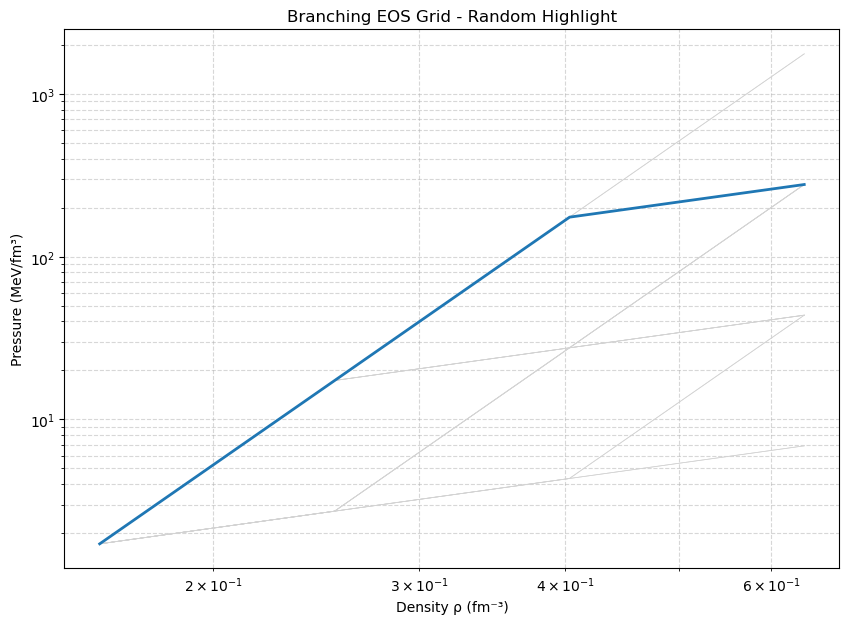

In [130]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
import random

# Important for Jupyter to show animations!
from matplotlib import rc
rc('animation', html='jshtml')

# Suppose eos_models is already a list of EOSPath instances
# And rho_plot is defined.

fig, ax = plt.subplots(figsize=(10, 7))

# Plot all EOS paths in light gray
for eos in eos_models:
    _, P = eos.get_curve(rho_plot)
    ax.plot(rho_plot, P, color='lightgray', lw=0.5)

highlight_line, = ax.plot([], [], color='tab:blue', lw=2)

ax.set_xscale('log')
ax.set_yscale('log')
ax.set_xlabel("Density ρ (fm⁻³)")
ax.set_ylabel("Pressure (MeV/fm³)")
ax.set_title("Branching EOS Grid - Random Highlight")
ax.grid(True, which='both', linestyle='--', alpha=0.5)

def update(frame):
    eos = random.choice(eos_models)
    _, P = eos.get_curve(rho_plot)
    highlight_line.set_data(rho_plot, P)
    return highlight_line,

anim = FuncAnimation(fig, update, frames=200, interval=500, blit=True)

anim  # ⚡ This line shows the animation in Jupyter


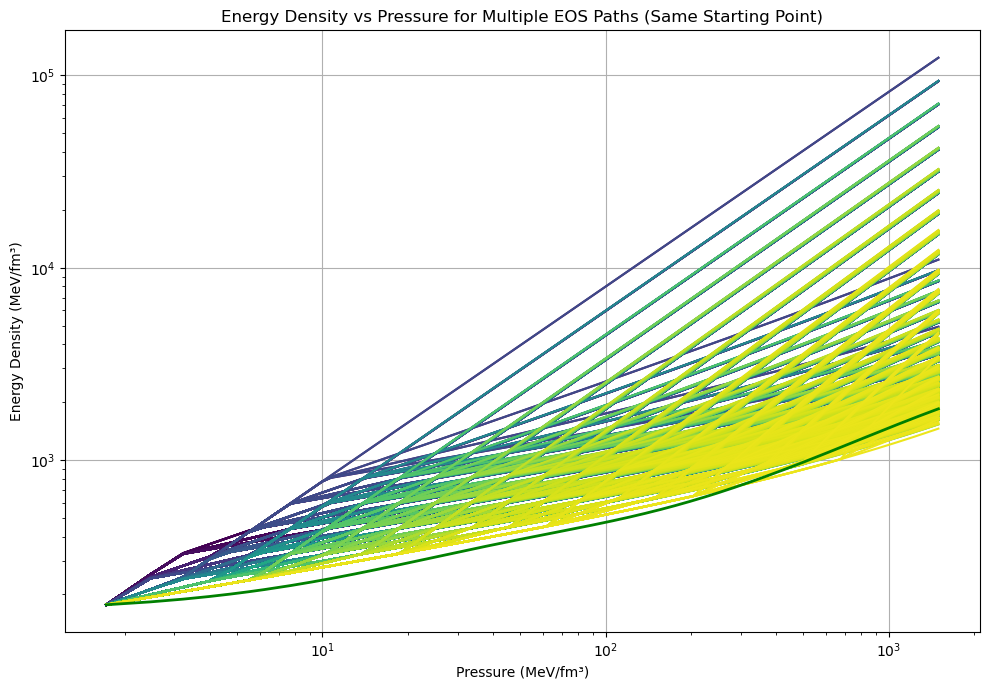

In [2]:
import numpy as np
import matplotlib.pyplot as plt
from itertools import product

# Constants
r_sat = 2.7e14  # g/cm^3
c = 2.998e8
MeV_to_J = 1.60218e-13

# Helper conversion
def conv_to_MeV(value):
    result = value * 1e3  # kg/m^3
    result = result * c**2  # J/m^3
    result = result / MeV_to_J  # MeV/m^3
    result = result * 1e-45  # MeV/fm^3
    return result

def HLPS_2(P):
    return 172.858 * (1 - np.exp(- P/22.8644)) + 2777.75 * (1 - np.exp(- P/1909.97)) + 161.553

# EOS Class
class EOSPath:
    def __init__(self, P0, E0, segment_densities, gammas, name= "EOS"):
        self.segment_densities = np.array(segment_densities)
        self.gammas = np.array(gammas)
        self.P0 = P0
        self.E0 = E0
        self.Pi = []
        self.Ei = []
        self.K_list = []
        self.name = name 
    def calculate_K(self, P, rho, gamma):
        return P / rho**gamma

    def calculate_P(self, rho, K, gamma):
        return K * rho**gamma

    def calculate_E(self, P, Ki, gamma, rho_i, P_i, E_i):
        if gamma == 1:
            return (E_i / rho_i) * P / Ki + np.log(1 / rho_i) * P - P * np.log(Ki / P)
        else:
            return (E_i / rho_i - P_i / (rho_i * (gamma - 1))) * (P / Ki)**(1 / gamma) + P / (gamma - 1)

    def calculate_parameters(self):
        Pi = [self.P0]
        Ei = [self.E0]
        K_list = []

        for i in range(len(self.gammas)):
            gamma = self.gammas[i]
            rho_i = self.segment_densities[i]
            P_i = Pi[-1]
            E_i = Ei[-1]

            K_i = self.calculate_K(P_i, rho_i, gamma)
            K_list.append(K_i)

            rho_next = self.segment_densities[i + 1]
            P_next = self.calculate_P(rho_next, K_i, gamma)
            E_next = self.calculate_E(P_next, K_i, gamma, rho_i, P_i, E_i)

            Pi.append(P_next)
            Ei.append(E_next)

        self.Pi = Pi
        self.Ei = Ei
        self.K_list = K_list
        return Pi, Ei, K_list

    def get_energy_from_pressure(self, P_query):
    # Find the correct segment for interpolation
        for i in range(len(self.Pi) - 1):
            if self.Pi[i] <= P_query <= self.Pi[i + 1]:
                P1 = self.Pi[i]
                E1 = self.Ei[i]
                K1 = self.K_list[i]
                gamma = self.gammas[i]
                return self.calculate_E(P_query, K1, gamma, self.segment_densities[i], P1, E1)

        # Extrapolate below the first segment
        if P_query < self.Pi[0]:
            P1 = self.Pi[0]
            E1 = self.Ei[0]
            K1 = self.K_list[0]
            gamma = self.gammas[0]
            return self.calculate_E(P_query, K1, gamma, self.segment_densities[0], P1, E1)

        # Extrapolate beyond the last segment
        if P_query > self.Pi[-1]:
            P1 = self.Pi[-2]
            E1 = self.Ei[-2]
            K1 = self.K_list[-1]
            gamma = self.gammas[-1]
            return self.calculate_E(P_query, K1, gamma, self.segment_densities[-2], P1, E1)

            

# Setup: Ensure all EOS paths start from the same pressure and energy density
P_sat = 1.722  # Starting pressure
E_sat = HLPS_2(P_sat)  # Starting energy density
r_sat_Mev_fm3 = conv_to_MeV(r_sat)  # Initial density in MeV/fm³

segments = 6
gamma_options = [1, 2, 3, 4]
segment_rhos = np.exp(np.linspace(np.log(r_sat_Mev_fm3), np.log(r_sat_Mev_fm3 * segments), segments + 1))
all_gamma_paths = list(product(gamma_options, repeat=segments))  # 81 combinations

# Define pressure array P (for example)
P_array = np.linspace(P_sat, 1500, 2000)  # Adjust size for desired resolution

# Plot energy densities for each EOS path
plt.figure(figsize=(10, 7))
colors = plt.cm.viridis(np.linspace(0, 1, len(all_gamma_paths)))
eos_objects = []

# Plot all EOS paths ensuring they start from the same point
# Mask P_array to start at P_sat
P_array_masked = P_array[P_array >= P_sat]

# Plot all EOS paths ensuring they start from the same point
for idx, gamma_path in enumerate(all_gamma_paths[120:]):
    eos = EOSPath(P_sat, E_sat, segment_rhos, gamma_path, name=f"EOS {idx+1}")
    eos_objects.append(eos)
    Pi, Ei, _ = eos.calculate_parameters()
    eos.Pi[0] = P_sat
    eos.Ei[0] = E_sat

    # Compute energy densities only for P >= P_sat
    energy_densities = [eos.get_energy_from_pressure(P) for P in P_array_masked]

    # Filter out None values
    valid = np.array([e is not None for e in energy_densities])
    if np.any(valid):
        plt.loglog(P_array_masked[valid], np.array(energy_densities)[valid], color=colors[idx])

# Plot HLPS-2 EOS starting from P_sat only
hlps_values = HLPS_2(P_array_masked)
plt.loglog(P_array_masked, hlps_values, color='green', lw=2, label="HLPS-2")

plt.xlabel("Pressure (MeV/fm³)")
plt.ylabel("Energy Density (MeV/fm³)")
plt.title("Energy Density vs Pressure for Multiple EOS Paths (Same Starting Point)")
plt.grid(True)
plt.tight_layout()
# plt.legend(fontsize="x-small", loc="upper left", ncol=2)
plt.show()
